In [21]:
!pip install torch
!pip install scikit-learn
!pip install scikit-image
!pip install earthengine-api
!pip install rasterio
!pip install lmdb
!pip install pyshp
!pip install shapely
!pip install pytorch-lightning
!pip install pytorch-lightning-bolts
!pip install torchvision

In [1]:
import os
import random
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!git clone https://github.com/Akkarapon-chaiyana/ChangeDetection.git

Cloning into 'ChangeDetection'...
remote: Enumerating objects: 104, done.
remote: Counting objects: 100% (104/104), done.
remote: Compressing objects: 100% (102/102), done.
remote: Total 104 (delta 49), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (104/104), 23.30 MiB | 10.22 MiB/s, done.
Resolving deltas: 100% (49/49), done.


In [4]:
%cd /content/ChangeDetection

/content/ChangeDetection


In [5]:
## Remarks main_oscd_inference.py will read ckp_resume differently.
## We can edit it on Colab of git clone folder.
!python main_oscd_inference.py \
--data_dir /content/drive/MyDrive/ChangeDetection/Images \
--ckp_path /content/drive/MyDrive/SSL4EO/model/B13_rn18_moco_0099_ckpt.pth \
--result_dir /content/drive/MyDrive/ChangeDetection/Output \
--n_channels 13 \
--n_epochs 10 \
--resnet_type 18

Seed set to 42
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/nn/functional.py:4102: UserWarning: nn.functional.upsample_nearest is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_nearest is deprecated. Use nn.functional.interpolate instead.")


In [44]:
import warnings
warnings.filterwarnings("ignore")
import os
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import glob

# Paths to the folders containing .tif files
Before_path = '/content/drive/MyDrive/ChangeDetection/Images/before'
After_path = '/content/drive/MyDrive/ChangeDetection/Images/after'
Ground_path = '/content/drive/MyDrive/ChangeDetection/Images/label'
Inference_path = '/content/drive/MyDrive/ChangeDetection/Output/Inference'

# List all .tif files in each folder
Before_files = sorted(glob.glob(os.path.join(Before_path, '*.tif')))
After_files = sorted(glob.glob(os.path.join(After_path, '*.tif')))
Ground_files = sorted(glob.glob(os.path.join(Ground_path, '*.tif')))
Inference_files = sorted(glob.glob(os.path.join(Inference_path, '*.tif')))

# Get the filenames without the path
Before_filenames = [os.path.basename(f) for f in Before_files]
After_filenames = [os.path.basename(f) for f in After_files]
Ground_filenames = [os.path.basename(f) for f in Ground_files]
Inference_filenames = [os.path.basename(f) for f in Inference_files]

# Find the common filenames
common_filenames = set(Before_filenames).intersection(After_filenames, Ground_filenames, Inference_filenames)

# Filter the files to only include those with common filenames
Before_files = [f for f in Before_files if os.path.basename(f) in common_filenames]
After_files = [f for f in After_files if os.path.basename(f) in common_filenames]
Ground_files = [f for f in Ground_files if os.path.basename(f) in common_filenames]
Inference_files = [f for f in Inference_files if os.path.basename(f) in common_filenames]

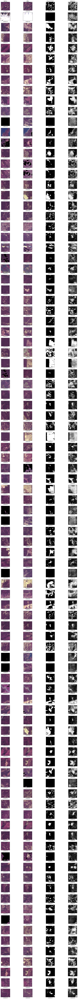

In [46]:
# Number of columns for the subplot
columns = 4

# Calculate the number of rows needed
num_files = len(Before_files)
rows = num_files

# Create a figure with subplots
plt.figure(figsize=(16, 160))

# Titles for each column
titles = ['Before', 'After', 'Ground Truth', 'Inference']

for i in range(num_files):
    files = [Before_files[i], After_files[i], Ground_files[i], Inference_files[i]]
    for j, file in enumerate(files):
        with rasterio.open(file) as src:
            if j == 0 or j == 1:  # Before and After images with bands 5, 4, 3 as RGB
                image = src.read([5, 4, 3]) / 2000.0
                image = image.clip(0, 1)  # Ensure the RGB values are within the range [0, 1]
            else:  # Ground Truth and Inference images
                image = src.read(1)  # Assuming Ground Truth and Inference images are single-band

            # Create subplot
            ax = plt.subplot(rows, columns, i * columns + j + 1)
            # Display the image
            show(image, ax=ax, transform=src.transform, cmap='gray' if j >= 2 else None)
            # Set title for the first row
            if i == 0:
                ax.set_title(titles[j])
            # Remove x and y ticks
            ax.set_xlabel(os.path.basename(file), fontsize=10)
            ax.set_xticks([])
            ax.set_yticks([])

plt.tight_layout()
plt.show()